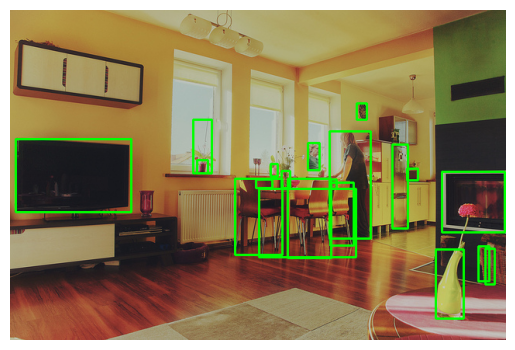

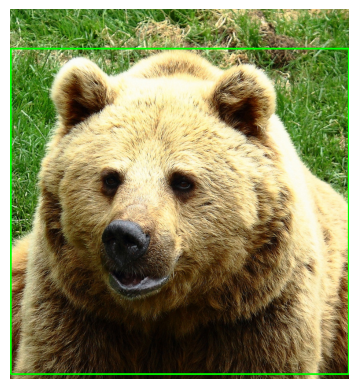

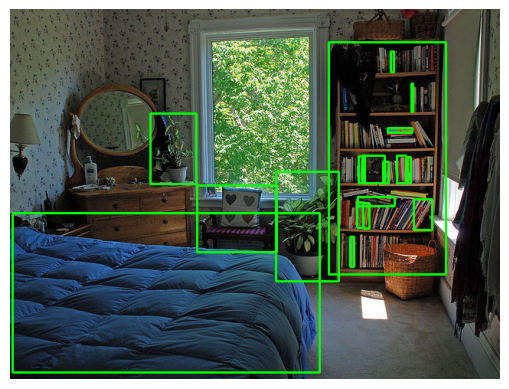

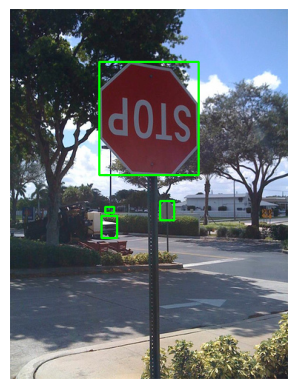

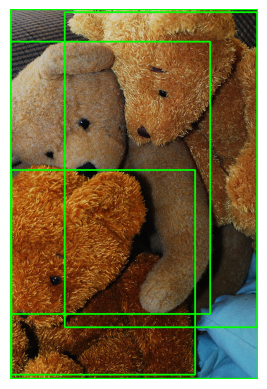

...

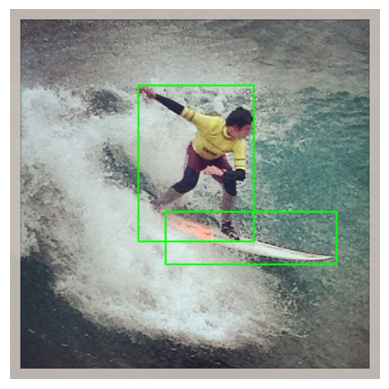

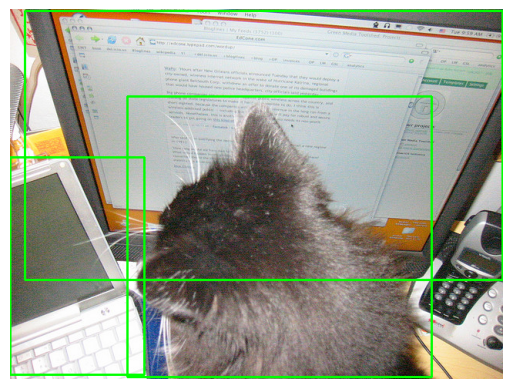

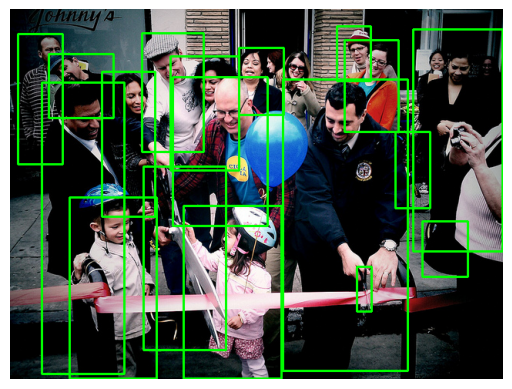

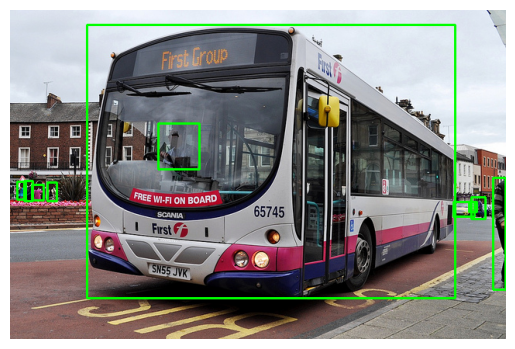

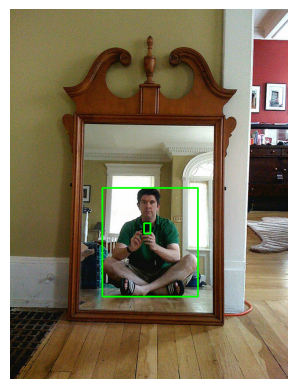

In [ ]:
import json
import os
import cv2
import matplotlib.pyplot as plt

# Path to your JSON file and image folder
json_file = r"C:\Users\harsh\Downloads\instances_val2017.json"
dataset_folder = r"C:\Users\harsh\Downloads\val2017-20241106T125252Z-001\val2017"

# Load the JSON file
with open(json_file, 'r') as f:
    data = json.load(f)

# Mapping image IDs to filenames
image_map = {image['id']: image['file_name'] for image in data['images']}

# Function to get bounding boxes for an image
def get_bounding_boxes(image_name):
    bounding_boxes = []
    # Loop through annotations to find bounding boxes for the current image
    for annotation in data['annotations']:
        if image_map[annotation['image_id']] == image_name:
            x, y, w, h = annotation['bbox']
            bounding_boxes.append([x, y, w, h])
    return bounding_boxes

# Function to display image with bounding boxes
import cv2
import matplotlib.pyplot as plt

# Function to display image with bounding boxes
def display_image_with_bboxes(image_path, bounding_boxes):
    image = cv2.imread(image_path)
    
    # Ensure image is loaded properly
    if image is None:
        print(f"Error loading image: {image_path}")
        return
    
    # Loop through the bounding boxes and draw them on the image
    for box in bounding_boxes:
        if len(box) == 4:
            x, y, w, h = map(int, box)  # Ensure all coordinates are integers
            # Draw the rectangle (top-left, bottom-right) with a green color and thickness 2
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
    # Convert BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.axis('off')  # Hide the axes
    plt.show()


# Loop through images in the dataset folder
for filename in os.listdir(dataset_folder):
    if filename.endswith(".jpg") or filename.endswith(".png"):  # Update as per your image format
        image_path = os.path.join(dataset_folder, filename)
        
        # Get bounding boxes for this image
        bounding_boxes = get_bounding_boxes(filename)
        
        if bounding_boxes:  # If bounding boxes exist
            # Display image with bounding boxes
            display_image_with_bboxes(image_path, bounding_boxes)